## Reddit Sentiment Analysis

## Loading data

In [0]:
import pyspark
from pyspark.sql import SparkSession

# Create a SparkSession
spark = SparkSession.builder.appName("myApp").getOrCreate()
spark.sparkContext.setLogLevel("ERROR")

# Set a random seed
spark.conf.set("spark.sql.shuffle.partitions", "4")

In [0]:
# Ensure you have uploaded our version of scraped data (reddit.csv) into your databricks instance

# File location and type
file_location = "/FileStore/tables/reddit.csv"

data = spark.read.csv(file_location, header=True, inferSchema=True)

## Tokenizing filtered sentences

In [0]:
# Author: Steven

from pyspark.sql.functions import udf, concat_ws
from pyspark.sql.types import ArrayType, StringType, DoubleType

# Tokenize filtered posts
# This cell will:
# 1. Define a tokenizer function to split the text into words.
# 2. Register the tokenizer as a Spark UDF.
# 3. Apply the tokenizer to the 'title_filtered' column and store the result in a new column called 'words'.

def tokenize(text: str) -> list:
    """
    Tokenize the input text by splitting it into words.
    
    Args:
        text (str): The input text to be tokenized.
        
    Returns:
        list: A list of tokenized words.
    """
    if text is None:
        return []
    
    return text.split()

# Register the tokenizer as a Spark UDF with a specified return type
tokenize_udf = udf(tokenize, ArrayType(StringType()))

# Apply the tokenizer to the 'title_filtered' column and store the result in a new column called 'words'
data = data.withColumn('words', tokenize_udf('title_filtered'))

## Feature Extraction
### Creating Bag of Words

In [0]:
# Author: Steven

from pyspark.ml.feature import CountVectorizer, HashingTF, IDF
from pyspark.sql.types import ArrayType, StringType, DoubleType

# This cell will:
# 1. Apply the bag-of-words technique using the CountVectorizer.
# 2. Fit and transform the CountVectorizer on the 'words' column.
# 3. Convert the 'Title_features' column from DenseVector to ArrayType(DoubleType).

# Initialize CountVectorizer with inputCol as 'words', and outputCol as 'Title_features'
cv = CountVectorizer(inputCol='words', outputCol='Title_features')

# Fit and transform the CountVectorizer on the 'words' column
cv_model = cv.fit(data)
data = cv_model.transform(data)

# Define a UDF to convert DenseVector to ArrayType(DoubleType)
def dense_vector_to_array(v: pyspark.ml.linalg.DenseVector) -> list:
    """
    Convert a DenseVector to a list of doubles.
    
    Args:
        v (pyspark.ml.linalg.DenseVector): The input DenseVector to be converted.
        
    Returns:
        list: A list of doubles.
    """
    return v.toArray().tolist()

# Register the UDF with a specified return type
to_array_udf = udf(dense_vector_to_array, ArrayType(DoubleType()))

# Convert the 'Title_features' column from DenseVector to ArrayType(DoubleType) and store it in a temporary column
data = data.withColumn('Title_features_temp', to_array_udf('Title_features'))

# Drop the original 'Title_features' column and rename the temporary column to 'Title_features'
data = data.drop('Title_features').withColumnRenamed('Title_features_temp', 'Title_features')

### Additional features
Features we want to take into our model are:
- Subreddit (encoded)
- Percent agreement (converted to float, then scaled)
- Num_of_comments (converted to float, then scaled)
- Score (converted to float, then scaled)
- Title_filtered (vectorized)

Target:
- Sentiment

In [0]:
# Author: Steven

# This cell will:
# 1. Drop any rows with missing values in the specified columns.
# 2. Print the number of rows remaining in the DataFrame.
# 3. Print the schema of the DataFrame.

# Drop rows with missing values in the specified columns
columns_to_check = ['Sentiment Value', 'Title_features', 'Percent_agreement', 'Num_comments', 'Score']
for column in columns_to_check:
    data = data.dropna(subset=[column])

# Print the number of rows remaining in the DataFrame
print('Number of rows:', data.count())

# Print the schema of the DataFrame
data.printSchema()

Number of rows: 1075
root
 |-- _c0: integer (nullable = true)
 |-- _c1: integer (nullable = true)
 |-- Subreddit: string (nullable = true)
 |-- Title: string (nullable = true)
 |-- Sentiment_Steven: string (nullable = true)
 |-- Sentiment_Jash: string (nullable = true)
 |-- Sentiment_Ameen: string (nullable = true)
 |-- Sentiment Value: string (nullable = true)
 |-- Percent_agreement: string (nullable = true)
 |-- Total Percent Agreement: string (nullable = true)
 |-- Expected Agreement 1: string (nullable = true)
 |-- Expected Agreement 2: string (nullable = true)
 |-- Expected Agreement 3: double (nullable = true)
 |-- Expected Agreement Sum (Pe): double (nullable = true)
 |-- Observed Agreement (Po): double (nullable = true)
 |-- Fleiss_kappa (k): string (nullable = true)
 |-- Score: integer (nullable = true)
 |-- Num_comments: integer (nullable = true)
 |-- Date: string (nullable = true)
 |-- Title_filtered: string (nullable = true)
 |-- words: array (nullable = true)
 |    |-- ele

### Scaling and encoding
- Use scaling for numeric features
- Encode categorical features

In [0]:
# Author: Steven

from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, VectorAssembler, MinMaxScaler
from pyspark.sql.functions import col, udf
from pyspark.sql.types import FloatType
from pyspark.ml.linalg import VectorUDT, Vectors

# This cell will:
# 1. Encode categorical columns.
# 2. Convert float columns to single-element vectors using UDFs.
# 3. Convert array columns to single-element vectors using UDFs.
# 4. Scale numerical columns using MinMaxScaler.
# 5. Build a data preprocessing pipeline.
# 6. Fit the pipeline and transform the data.
# 7. Select the required columns for the final DataFrame.

# UDF to convert float columns to single-element vectors
def float_to_vector_udf(value: float) -> pyspark.ml.linalg.DenseVector:
    return Vectors.dense([value])

float_to_vector = udf(float_to_vector_udf, VectorUDT())

# UDF to convert array columns to single-element vectors
def array_to_vector_udf(value: list) -> pyspark.ml.linalg.DenseVector:
    return Vectors.dense(value)

array_to_vector = udf(array_to_vector_udf, VectorUDT())

# StringIndexer for encoding categorical columns
subreddit_indexer = StringIndexer(inputCol="Subreddit", outputCol="Subreddit_encoded")
sentiment_indexer = StringIndexer(inputCol="Sentiment Value", outputCol="Sentiment_encoded")

# Convert columns to float and then to single-element vectors using the UDF
data = data.withColumn("Num_comments_vector", float_to_vector(col("Num_comments").cast(FloatType())))
data = data.withColumn("Score_vector", float_to_vector(col("Score").cast(FloatType())))

# Convert array columns to vectors
data = data.withColumn("Title_features_vector", array_to_vector("Title_features"))

# MinMaxScaler for scaling numerical columns
num_comments_scaler = MinMaxScaler(inputCol="Num_comments_vector", outputCol="Num_comments_scaled")
score_scaler = MinMaxScaler(inputCol="Score_vector", outputCol="Score_scaled")

# Build the data preprocessing pipeline
preprocess_pipeline = Pipeline(stages=[
    subreddit_indexer,
    num_comments_scaler,
    score_scaler,
    sentiment_indexer,
])

# Fit the pipeline and transform the data
model = preprocess_pipeline.fit(data)
transformed_df = model.transform(data)

# Convert double
transformed_df = transformed_df.withColumn("Subreddit_vector", float_to_vector(col("Subreddit_encoded").cast(FloatType())))

# Select the required columns
final_df = transformed_df.select(
    "Title",
    "Subreddit_vector",
    "Num_comments_scaled",
    "Score_scaled",
    "Title_features_vector",
    "Sentiment_encoded",
)

In [0]:
final_df.count()

Out[9]: 1075

In [0]:
# Show full feature extraction
final_df.show(10)

+--------------------+----------------+--------------------+--------------------+---------------------+-----------------+
|               Title|Subreddit_vector| Num_comments_scaled|        Score_scaled|Title_features_vector|Sentiment_encoded|
+--------------------+----------------+--------------------+--------------------+---------------------+-----------------+
|microsoft bing ju...|           [8.0]|[0.02776171197223...|[0.05591026747195...| [0.0,2.0,0.0,0.0,...|              1.0|
|1 million people ...|           [8.0]|[0.04742625795257...|[0.03295944779982...| [0.0,1.0,0.0,0.0,...|              1.0|
|microsoft says gp...|           [8.0]|[0.00867553499132...|[0.02778257118205...| [0.0,0.0,0.0,0.0,...|              1.0|
|"""i asked the ne...|           [8.0]|[0.01388085598611...|[0.02847282139775...| [1.0,1.0,0.0,0.0,...|              1.0|
|i used bing befor...|           [8.0]|[0.04337767495662...|[0.02640207075064...| [0.0,1.0,0.0,0.0,...|              0.0|
|woke up to 45 ema...|  

In [0]:
final_df.printSchema()

root
 |-- Title: string (nullable = true)
 |-- Subreddit_vector: vector (nullable = true)
 |-- Num_comments_scaled: vector (nullable = true)
 |-- Score_scaled: vector (nullable = true)
 |-- Title_features_vector: vector (nullable = true)
 |-- Sentiment_encoded: double (nullable = false)



In [0]:
# Feature extraction complete
final_df.printSchema()

root
 |-- Title: string (nullable = true)
 |-- Subreddit_vector: vector (nullable = true)
 |-- Num_comments_scaled: vector (nullable = true)
 |-- Score_scaled: vector (nullable = true)
 |-- Title_features_vector: vector (nullable = true)
 |-- Sentiment_encoded: double (nullable = false)



## Splitting data

In [0]:
# Author: Steven

# This cell will:
# 1. Split the data into training and testing sets.
# 2. Persist the training and testing data in memory.

# Split the data into training and testing sets using an 80/20 split and a fixed seed for reproducibility
train_data, test_data = final_df.randomSplit([0.8, 0.2], seed=42)

# Persist the training and testing data in memory for faster access during model training and evaluation
train_data.persist()
test_data.persist()

Out[13]: DataFrame[Title: string, Subreddit_vector: vector, Num_comments_scaled: vector, Score_scaled: vector, Title_features_vector: vector, Sentiment_encoded: double]

### Show the distribution of class labels on split

In [0]:
# Author: Ameen

from pyspark.sql.functions import count

# Show count of each sentiment class in train and test split
train_data.groupBy('Sentiment_encoded').agg(count('*').alias('count')).show()
test_data.groupBy('Sentiment_encoded').agg(count('*').alias('count')).show()

+-----------------+-----+
|Sentiment_encoded|count|
+-----------------+-----+
|              0.0|  467|
|              1.0|  223|
|              2.0|  205|
+-----------------+-----+

+-----------------+-----+
|Sentiment_encoded|count|
+-----------------+-----+
|              0.0|   94|
|              1.0|   43|
|              2.0|   43|
+-----------------+-----+



/databricks/spark/python/pyspark/sql/pandas/conversion.py:119: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Unable to convert the field Subreddit_vector. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Direct cause: Unsupported type in conversion to Arrow: VectorUDT()
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
  warn(msg)
/databricks/spark/python/pyspark/sql/pandas/conversion.py:119: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Unable to convert the field Subreddit_vector. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Direct cause: Unsupported type in conversion to Arrow

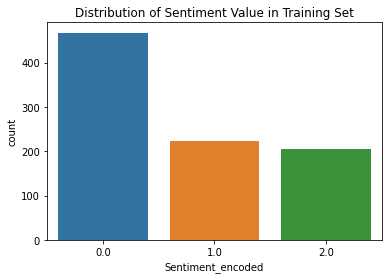

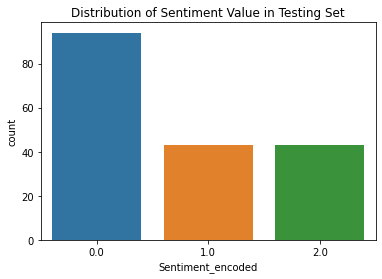

In [0]:
# Author: Ameen

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Convert the PySpark data frames to pandas data frames
train_data_pd = train_data.toPandas()
test_data_pd = test_data.toPandas()

# Plot the distribution of Sentiment_encoded in the training set
sns.countplot(x='Sentiment_encoded', data=train_data_pd)
plt.title('Distribution of Sentiment Value in Training Set')
plt.show()

# Plot the distribution of Sentiment_encoded in the testing set
sns.countplot(x='Sentiment_encoded', data=test_data_pd)
plt.title('Distribution of Sentiment Value in Testing Set')
plt.show()

## Machine learning models

### Functions to evaluate and display confusion matrix

In [0]:
# Author: Jash

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pyspark.ml import Pipeline
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.classification import OneVsRest, LinearSVC
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.mllib.evaluation import MulticlassMetrics
from pyspark.ml.classification import LogisticRegression, NaiveBayes, RandomForestClassifier

# This cell defines functions for fitting, evaluating, and plotting the confusion matrix of classification models.

def fit_evaluate(pipeline: Pipeline, data: pyspark.sql.DataFrame) -> tuple:
    """
    Fit the given pipeline to the data and evaluate the resulting model.
    
    Args:
        pipeline (Pipeline): The pipeline to fit and evaluate.
        data (pyspark.sql.DataFrame): The input data for fitting the pipeline.
    
    Returns:
        tuple: A tuple containing accuracy, precision, recall, and predictions.
    """
    if isinstance(pipeline, pyspark.ml.Pipeline):
        model = pipeline.fit(data)
    else:
        model = pipeline
    accuracy, precision, recall, predictions = evaluate_model(model, test_data)
    return accuracy, precision, recall, predictions

def evaluate_model(model, data: pyspark.sql.DataFrame) -> tuple:
    """
    Evaluate the given model on the specified data.
    
    Args:
        model: The model to evaluate.
        data (pyspark.sql.DataFrame): The input data for evaluating the model.
    
    Returns:
        tuple: A tuple containing accuracy, precision, recall, and predictions.
    """
    predictions = model.transform(data)
    evaluator = MulticlassClassificationEvaluator(labelCol="Sentiment_encoded", predictionCol="prediction")
    accuracy = evaluator.evaluate(predictions, {evaluator.metricName: "accuracy"})
    precision = evaluator.evaluate(predictions, {evaluator.metricName: "weightedPrecision"})
    recall = evaluator.evaluate(predictions, {evaluator.metricName: "weightedRecall"})
    return accuracy, precision, recall, predictions

def plot_confusion_matrix(predictions: pyspark.sql.DataFrame):
    """
    Plot the normalized confusion matrix for the given predictions.
    
    Args:
        predictions (pyspark.sql.DataFrame): The DataFrame containing the model's predictions.
    """
    prediction_and_label = predictions.select(['prediction', 'Sentiment_encoded']).rdd
    metrics = MulticlassMetrics(prediction_and_label)
    confusion_matrix = metrics.confusionMatrix().toArray()
    normalized_confusion_matrix = confusion_matrix.astype('float') / confusion_matrix.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(8, 6))
    sns.heatmap(normalized_confusion_matrix, annot=True, cmap='Blues')
    plt.title('Normalized Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

### SVM (only text features)

SVM (only text features):
Accuracy = 0.5777777777777777
Precision = 0.567324097674565
Recall = 0.5777777777777778
F1 Score = 0.572503


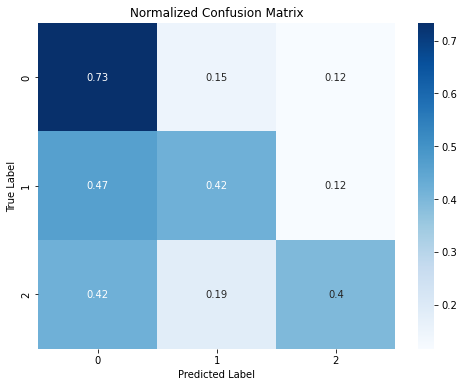

In [0]:
# Author: Jash

# SVM and One-vs-Rest classifier
svm = LinearSVC(featuresCol="Features", labelCol="Sentiment_encoded", maxIter=10, regParam=0.1)
ovr = OneVsRest(classifier=svm, featuresCol="Features", labelCol="Sentiment_encoded")
# Assembler
assembler = VectorAssembler(inputCols=["Title_features_vector"], outputCol="Features")
# Create pipeline
svm_pipeline = Pipeline(stages=[assembler, ovr])

# Fit the model and evaluate
accuracy, precision, recall, predictions = fit_evaluate(svm_pipeline, train_data)
print('SVM (only text features):')
print("Accuracy =", accuracy)
print("Precision =", precision)
print("Recall =", recall)
print('F1 Score = %g' % (2 * (precision * recall) / (precision + recall)))

# Plot confusion matrix
plot_confusion_matrix(predictions)

### SVM (text, engagement)

SVM (text, engagement):
Accuracy = 0.5722222222222222
Precision = 0.5619549266247379
Recall = 0.5722222222222222
F1 Score = 0.567042


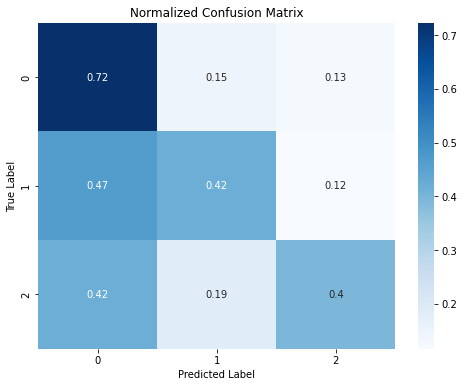

In [0]:
# Author: Jash

# SVM and One-vs-Rest classifier
svm = LinearSVC(featuresCol="Features", labelCol="Sentiment_encoded", maxIter=10, regParam=0.1)
ovr = OneVsRest(classifier=svm, featuresCol="Features", labelCol="Sentiment_encoded")
# Assembler
assembler = VectorAssembler(inputCols=["Num_comments_scaled", "Score_scaled", "Title_features_vector"], outputCol="Features")
# Create pipeline
svm_pipeline = Pipeline(stages=[assembler, ovr])

# Fit the model and evaluate
accuracy, precision, recall, predictions = fit_evaluate(svm_pipeline, train_data)
print('SVM (text, engagement):')
print("Accuracy =", accuracy)
print("Precision =", precision)
print("Recall =", recall)
print('F1 Score = %g' % (2 * (precision * recall) / (precision + recall)))

# Plot confusion matrix
plot_confusion_matrix(predictions)

### SVM (text, engagement, subreddit class)

SVM (text, engagement, subreddit class):
Accuracy = 0.5722222222222222
Precision = 0.5651358917943077
Recall = 0.5722222222222222
F1 Score = 0.568657


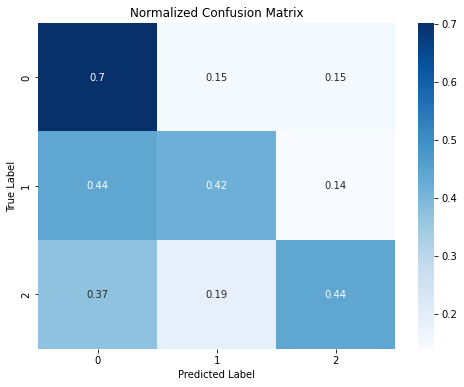

In [0]:
# Author: Jash

# SVM and One-vs-Rest classifier
svm = LinearSVC(featuresCol="Features", labelCol="Sentiment_encoded", maxIter=10, regParam=0.1)
ovr = OneVsRest(classifier=svm, featuresCol="Features", labelCol="Sentiment_encoded")
# Assembler
assembler = VectorAssembler(inputCols=["Subreddit_vector", "Num_comments_scaled", "Score_scaled", "Title_features_vector"], outputCol="Features")

# Create pipeline
svm_pipeline = Pipeline(stages=[assembler, ovr])

# Fit the model and evaluate
accuracy, precision, recall, predictions = fit_evaluate(svm_pipeline, train_data)
print('SVM (text, engagement, subreddit class):')
print("Accuracy =", accuracy)
print("Precision =", precision)
print("Recall =", recall)
print('F1 Score = %g' % (2 * (precision * recall) / (precision + recall)))

# Plot confusion matrix
plot_confusion_matrix(predictions)

### Logistic Regression (only text features)

Logistic Regression (only text features):
Accuracy = 0.5722222222222222
Precision = 0.5652356902356903
Recall = 0.5722222222222222
F1 Score = 0.568707


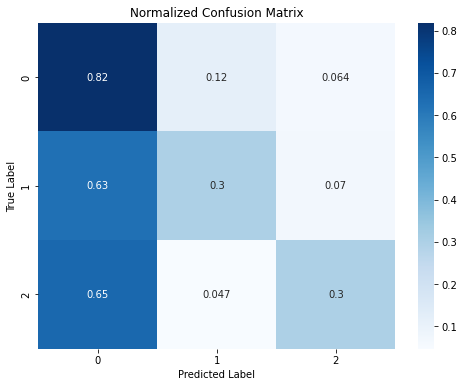

In [0]:
# Author: Jash

# Logistic Regression
lr = LogisticRegression(featuresCol="Features", labelCol="Sentiment_encoded", maxIter=10, regParam=0.1)

# Assembler
assembler = VectorAssembler(inputCols=["Title_features_vector"], outputCol="Features")

# Create pipeline
lr_pipeline = Pipeline(stages=[assembler, lr])

# Fit the model and evaluate
accuracy, precision, recall, predictions = fit_evaluate(lr_pipeline, train_data)
print("Logistic Regression (only text features):")
print("Accuracy =", accuracy)
print("Precision =", precision)
print("Recall =", recall)
print('F1 Score = %g' % (2 * (precision * recall) / (precision + recall)))

# Plot confusion matrix
plot_confusion_matrix(predictions)

### Logistic Regression (text and engagement)

Logistic Regression (text and engagement):
Accuracy = 0.5722222222222222
Precision = 0.5652356902356903
Recall = 0.5722222222222222
F1 Score = 0.568707


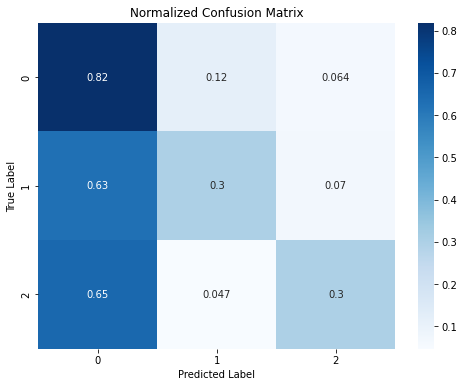

In [0]:
# Author: Jash

# Logistic Regression
lr = LogisticRegression(featuresCol="Features", labelCol="Sentiment_encoded", maxIter=10, regParam=0.1)

# Assembler
assembler = VectorAssembler(inputCols=["Num_comments_scaled", "Score_scaled", "Title_features_vector"], outputCol="Features")

# Create pipeline
lr_pipeline = Pipeline(stages=[assembler, lr])

# Fit the model and evaluate
accuracy, precision, recall, predictions = fit_evaluate(lr_pipeline, train_data)
print("Logistic Regression (text and engagement):")
print("Accuracy =", accuracy)
print("Precision =", precision)
print("Recall =", recall)
print('F1 Score = %g' % (2 * (precision * recall) / (precision + recall)))

# Plot confusion matrix
plot_confusion_matrix(predictions)

### Logistic Regression (text, engagement, subreddit class)

Logistic Regression (text, engagement, subreddit class):
Accuracy = 0.5722222222222222
Precision = 0.5652356902356903
Recall = 0.5722222222222222
F1 Score = 0.568707


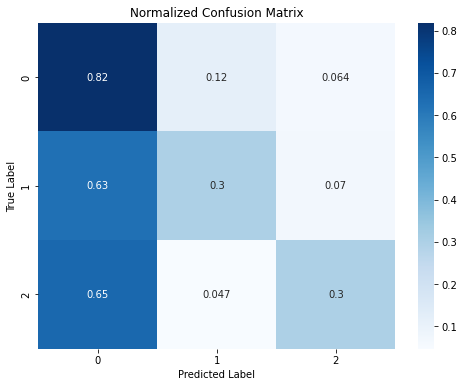

In [0]:
# Author: Jash

# Logistic Regression
lr = LogisticRegression(featuresCol="Features", labelCol="Sentiment_encoded", maxIter=10, regParam=0.1)

# Assembler
assembler = VectorAssembler(inputCols=["Subreddit_vector", "Num_comments_scaled", "Score_scaled", "Title_features_vector"], outputCol="Features")

# Create pipeline
lr_pipeline = Pipeline(stages=[assembler, lr])

# Fit the model and evaluate
accuracy, precision, recall, predictions = fit_evaluate(lr_pipeline, train_data)
print("Logistic Regression (text, engagement, subreddit class):")
print("Accuracy =", accuracy)
print("Precision =", precision)
print("Recall =", recall)
print('F1 Score = %g' % (2 * (precision * recall) / (precision + recall)))

# Plot confusion matrix
plot_confusion_matrix(predictions)

### Naive Bayes (only text features)

Naive Bayes (only text features):
Accuracy = 0.5277777777777778
Precision = 0.5190288473291773
Recall = 0.5277777777777777
F1 Score = 0.523367


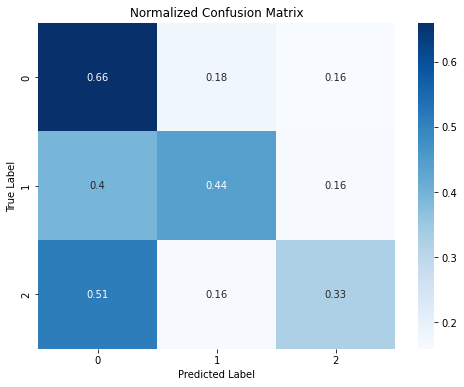

In [0]:
# Author: Jash

# Naive Bayes classifier
nb = NaiveBayes(featuresCol="Features", labelCol="Sentiment_encoded", smoothing=1.0)

# Assembler
assembler = VectorAssembler(inputCols=["Title_features_vector"], outputCol="Features")

# Create pipeline
nb_pipeline = Pipeline(stages=[assembler, nb])

# Fit the model and evaluate
accuracy, precision, recall, predictions = fit_evaluate(nb_pipeline, train_data)
print("Naive Bayes (only text features):")
print("Accuracy =", accuracy)
print("Precision =", precision)
print("Recall =", recall)
print('F1 Score = %g' % (2 * (precision * recall) / (precision + recall)))

# Plot confusion matrix
plot_confusion_matrix(predictions)

### Naive Bayes (text, engagement)

Naive Bayes (text, engagement):
Accuracy = 0.5277777777777778
Precision = 0.5190288473291773
Recall = 0.5277777777777777
F1 Score = 0.523367


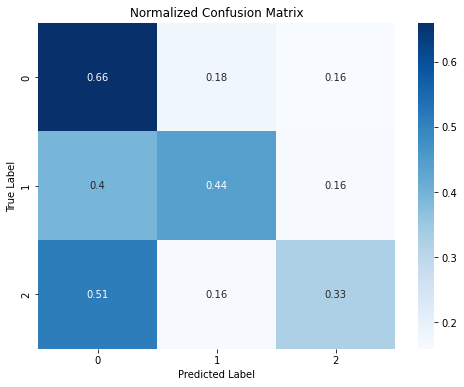

In [0]:
# Author: Jash

# Naive Bayes classifier
nb = NaiveBayes(featuresCol="Features", labelCol="Sentiment_encoded", smoothing=1.0)

# Assembler
assembler = VectorAssembler(inputCols=["Num_comments_scaled", "Score_scaled", "Title_features_vector"], outputCol="Features")

# Create pipeline
nb_pipeline = Pipeline(stages=[assembler, nb])

# Fit the model and evaluate
accuracy, precision, recall, predictions = fit_evaluate(nb_pipeline, train_data)
print("Naive Bayes (text, engagement):")
print("Accuracy =", accuracy)
print("Precision =", precision)
print("Recall =", recall)
print('F1 Score = %g' % (2 * (precision * recall) / (precision + recall)))

# Plot confusion matrix
plot_confusion_matrix(predictions)

### Naive Bayes (text, engagement, subreddit class)

Naive Bayes (text, engagement, subreddit class):
Accuracy = 0.5555555555555556
Precision = 0.5447516977044536
Recall = 0.5555555555555556
F1 Score = 0.550101


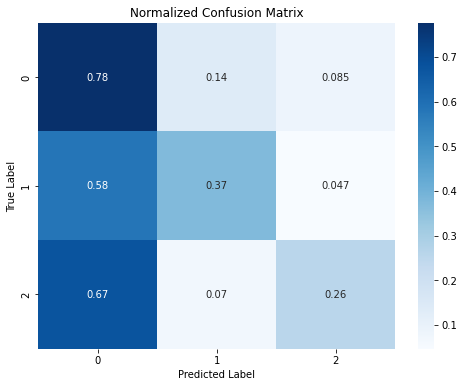

In [0]:
# Author: Jash

# Naive Bayes classifier
nb = NaiveBayes(featuresCol="Features", labelCol="Sentiment_encoded", smoothing=1.0)

# Assembler
assembler = VectorAssembler(inputCols=["Subreddit_vector", "Num_comments_scaled", "Score_scaled", "Title_features_vector"], outputCol="Features")

# Create pipeline
nb_pipeline = Pipeline(stages=[assembler, nb])

# Fit the model and evaluate
accuracy, precision, recall, predictions = fit_evaluate(nb_pipeline, train_data)
print("Naive Bayes (text, engagement, subreddit class):")
print("Accuracy =", accuracy)
print("Precision =", precision)
print("Recall =", recall)
print('F1 Score = %g' % (2 * (precision * recall) / (precision + recall)))

# Plot confusion matrix
plot_confusion_matrix(predictions)

### Random Forest (only text)

Random Forest (only text):
Accuracy = 0.5333333333333333
Precision = 0.45511363636363633
Recall = 0.5333333333333334
F1 Score = 0.491129


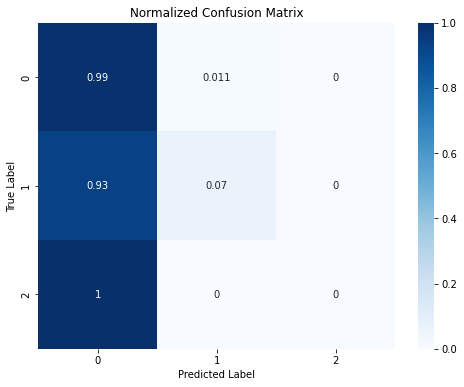

In [0]:
# Author: Jash

# Random Forest classifier
rf = RandomForestClassifier(featuresCol="Features", labelCol="Sentiment_encoded", numTrees=20, maxDepth=15)

# Assembler
assembler = VectorAssembler(inputCols=["Title_features_vector"], outputCol="Features")

# Create pipeline
rf_pipeline = Pipeline(stages=[assembler, rf])

# Fit the model and evaluate
accuracy, precision, recall, predictions = fit_evaluate(rf_pipeline, train_data)
print("Random Forest (only text):")
print("Accuracy =", accuracy)
print("Precision =", precision)
print("Recall =", recall)
print('F1 Score = %g' % (2 * (precision * recall) / (precision + recall)))

# Plot confusion matrix
plot_confusion_matrix(predictions)

### Random Forest (text, engagement)

Random Forest (text, engagement):
Accuracy = 0.5333333333333333
Precision = 0.514669163545568
Recall = 0.5333333333333333
F1 Score = 0.523835


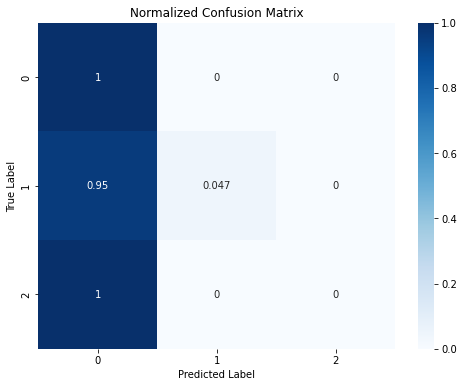

In [0]:
# Author: Jash

# Random Forest classifier
rf = RandomForestClassifier(featuresCol="Features", labelCol="Sentiment_encoded", numTrees=20, maxDepth=15)

# Assembler
assembler = VectorAssembler(inputCols=["Num_comments_scaled", "Score_scaled", "Title_features_vector"], outputCol="Features")

# Create pipeline
rf_pipeline = Pipeline(stages=[assembler, rf])

# Fit the model and evaluate
accuracy, precision, recall, predictions = fit_evaluate(rf_pipeline, train_data)
print("Random Forest (text, engagement):")
print("Accuracy =", accuracy)
print("Precision =", precision)
print("Recall =", recall)
print('F1 Score = %g' % (2 * (precision * recall) / (precision + recall)))

# Plot confusion matrix
plot_confusion_matrix(predictions)

### Random Forest (text, engagement, subreddit class)

Random Forest (text, engagement, subreddit class):
Accuracy = 0.5333333333333333
Precision = 0.45511363636363633
Recall = 0.5333333333333334
F1 Score = 0.491129


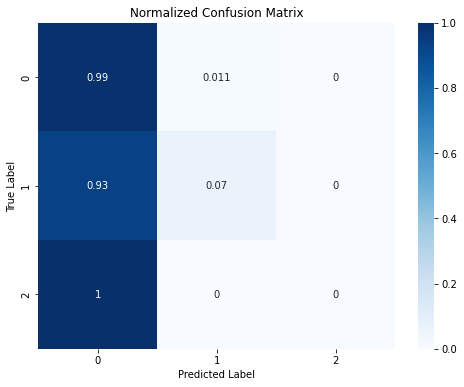

In [0]:
# Author: Jash

# Random Forest classifier
rf = RandomForestClassifier(featuresCol="Features", labelCol="Sentiment_encoded", numTrees=20, maxDepth=15)

# Assembler
assembler = VectorAssembler(inputCols=["Subreddit_vector", "Num_comments_scaled", "Score_scaled", "Title_features_vector"], outputCol="Features")

# Create pipeline
rf_pipeline = Pipeline(stages=[assembler, rf])

# Fit the model and evaluate
accuracy, precision, recall, predictions = fit_evaluate(rf_pipeline, train_data)
print("Random Forest (text, engagement, subreddit class):")
print("Accuracy =", accuracy)
print("Precision =", precision)
print("Recall =", recall)
print('F1 Score = %g' % (2 * (precision * recall) / (precision + recall)))

# Plot confusion matrix
plot_confusion_matrix(predictions)

## Best observed model
- SVM with only text data

```
SVM (only text features):
Accuracy = 0.5777777777777777
Precision = 0.567324097674565
Recall = 0.5777777777777778
F1 Score = 0.572503
```

## Hyperparameter tuning on best model

Best regularization parameter: 0.001
Best maximum iterations: 1

Metrics with Cross Validation:
Accuracy = 0.583333
Precision = 0.578703
Recall = 0.583333
F1 Score = 0.581009
/databricks/spark/python/pyspark/sql/context.py:165: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


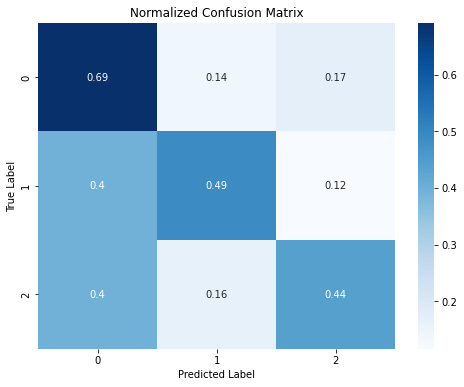

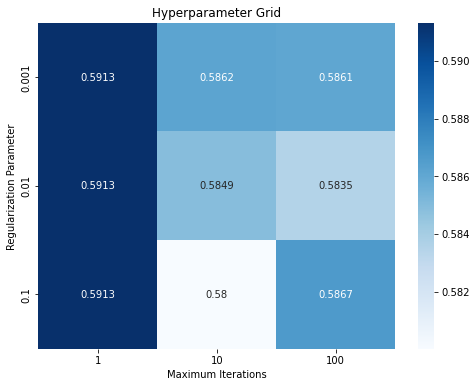

In [0]:
# Author: Ameen

def create_svm_pipeline() -> Pipeline:
    """
    Create an SVM pipeline for sentiment analysis.
    
    Returns:
        Pipeline: The SVM pipeline.
    """
    svm = LinearSVC(featuresCol="Features", labelCol="Sentiment_encoded")
    ovr = OneVsRest(classifier=svm, featuresCol="Features", labelCol="Sentiment_encoded")
    assembler = VectorAssembler(inputCols=["Title_features_vector"], outputCol="Features")
    svm_pipeline = Pipeline(stages=[assembler, ovr])
    return svm_pipeline, svm

def tune_hyperparameters(pipeline: Pipeline, param_grid: list, train_data: pyspark.sql.DataFrame) -> pyspark.ml.tuning.CrossValidatorModel:
    """
    Tune the hyperparameters of the given pipeline using cross-validation.
    
    Args:
        pipeline (Pipeline): The pipeline to tune.
        param_grid (list): The hyperparameter grid to search.
        train_data (pyspark.sql.DataFrame): The training data.
    
    Returns:
        pyspark.ml.tuning.CrossValidatorModel: The cross-validator model.
    """
    evaluator = MulticlassClassificationEvaluator(labelCol="Sentiment_encoded", predictionCol="prediction", metricName="accuracy")
    cv = CrossValidator(estimator=pipeline,
                        estimatorParamMaps=param_grid,
                        evaluator=evaluator,
                        numFolds=3)
    cvsModel = cv.fit(train_data)
    return cvsModel

def plot_hyperparameter_grid(param_grid: list, avg_metrics: list):
    """
    Plot the hyperparameter grid search results using Seaborn.
    
    Args:
        param_grid (list): The hyperparameter grid.
        avg_metrics (list): The average metrics for each hyperparameter combination.
    """
    param_grid_df = pd.DataFrame(param_grid)
    param_grid_df['accuracy'] = avg_metrics
    param_grid_df.columns = ['regParam', 'maxIter', 'accuracy']

    plt.figure(figsize=(8, 6))
    sns.heatmap(param_grid_df.pivot('regParam', 'maxIter', 'accuracy'), annot=True, cmap='Blues', fmt='.4g')
    plt.title('Hyperparameter Grid')
    plt.xlabel('Maximum Iterations')
    plt.ylabel('Regularization Parameter')
    plt.show()

# Create the SVM pipeline
svm_pipeline, svm = create_svm_pipeline()

# Define the hyperparameter grid for the LinearSVC model
paramGrid = ParamGridBuilder() \
    .addGrid(svm.regParam, [0.001, 0.01, 0.1]) \
    .addGrid(svm.maxIter, [1, 10, 100]) \
    .build()

# Tune the hyperparameters using cross-validation
cvsModel = tune_hyperparameters(svm_pipeline, paramGrid, train_data)

# Get the best model and hyperparameters
best_model = cvsModel.bestModel
best_svm_model = best_model.stages[-1].models[0]
best_reg_param = best_svm_model.getRegParam()
best_max_iter = best_svm_model.getMaxIter()

# Print the best hyperparameters
print(f"Best regularization parameter: {best_reg_param}")
print(f"Best maximum iterations: {best_max_iter}")

# Evaluate and compare model performance with and without cross-validation
accuracy_no_cv, precision_no_cv, recall_no_cv, predictions_no_cv = fit_evaluate(svm_pipeline, train_data)
accuracy, precision, recall, predictions = fit_evaluate(best_model, train_data)

# Print performance metrics
print("\nMetrics with Cross Validation:")
print("Accuracy = %g" % accuracy)
print("Precision = %g" % precision)
print("Recall = %g" % recall)
print('F1 Score = %g' % (2 * (precision * recall) / (precision + recall)))

# Create and display confusion matrix
plot_confusion_matrix(predictions)

# Plot the hyperparameter grid using Seaborn
plot_hyperparameter_grid(paramGrid, cvsModel.avgMetrics)

## Plotting ROC curve


SVM predictions:
Accuracy = 0.5777777777777777
Precision = 0.567324097674565
Recall = 0.5777777777777778
/databricks/spark/python/pyspark/sql/pandas/conversion.py:119: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Unable to convert the field rawPrediction. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Direct cause: Unsupported type in conversion to Arrow: VectorUDT()
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
  warn(msg)


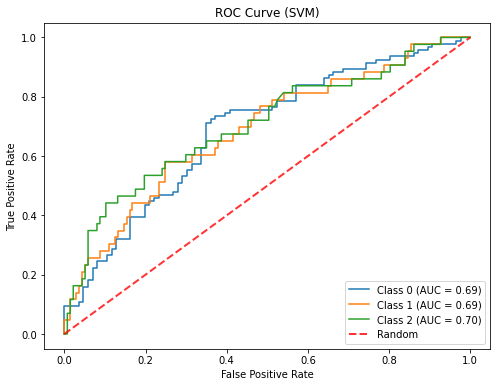


Logistic Regression predictions:
Accuracy = 0.5722222222222222
Precision = 0.5652356902356903
Recall = 0.5722222222222222
/databricks/spark/python/pyspark/sql/pandas/conversion.py:119: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Unable to convert the field rawPrediction. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Direct cause: Unsupported type in conversion to Arrow: VectorUDT()
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
  warn(msg)


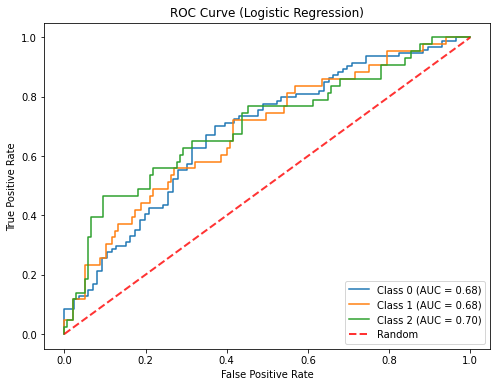


Naive Bayes predictions:
Accuracy = 0.5555555555555556
Precision = 0.5447516977044536
Recall = 0.5555555555555556
/databricks/spark/python/pyspark/sql/pandas/conversion.py:119: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Unable to convert the field rawPrediction. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Direct cause: Unsupported type in conversion to Arrow: VectorUDT()
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
  warn(msg)


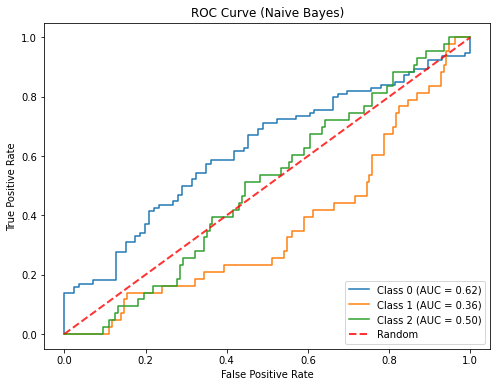


Random Forest predictions:
Accuracy = 0.5333333333333333
Precision = 0.45511363636363633
Recall = 0.5333333333333334
/databricks/spark/python/pyspark/sql/pandas/conversion.py:119: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Unable to convert the field rawPrediction. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Direct cause: Unsupported type in conversion to Arrow: VectorUDT()
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
  warn(msg)


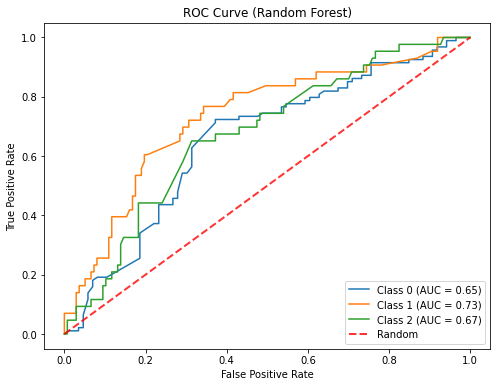

In [0]:
# Author: Ameen

import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from pyspark.ml.classification import RandomForestClassifier

def plot_roc_curve(predictions, num_classes, model_name):
    """
    Plot ROC curve for each class in a multiclass classification problem.
    
    Args:
        predictions (pd.DataFrame): Predictions DataFrame with probability columns for each class.
        num_classes (int): The number of classes.
        model_name (str): The name of the model for the plot title.
    """
    plt.figure(figsize=(8, 6))

    for i in range(num_classes):
        binary_labels = (predictions['Sentiment_encoded'] == i).astype(int)
        binary_scores = predictions[f'probability_{i}']

        fpr, tpr, _ = roc_curve(binary_labels, binary_scores)
        auc = roc_auc_score(binary_labels, binary_scores)

        plt.plot(fpr, tpr, label=f'Class {i} (AUC = {auc:.2f})')

    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Random', alpha=.8)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve ({model_name})')
    plt.legend(loc="lower right")
    plt.show()

def extract_probabilities(predictions):
    """
    Extract probability columns for each class from rawPrediction column.
    
    Args:
        predictions (pyspark.sql.DataFrame): Predictions DataFrame with rawPrediction column.
        
    Returns:
        pd.DataFrame: Pandas DataFrame with probability columns for each class.
    """
    predictions_pd = predictions.select("Sentiment_encoded", "rawPrediction").toPandas()
    for i in range(3):
        predictions_pd[f'probability_{i}'] = predictions_pd['rawPrediction'].apply(lambda x: x[i])
    return predictions_pd

# Fit and evaluate models
models = {"SVM": svm_pipeline, "Logistic Regression": lr_pipeline, "Naive Bayes": nb_pipeline, "Random Forest": rf_pipeline}
for model_name, pipeline in models.items():
    accuracy, precision, recall, predictions = fit_evaluate(pipeline, train_data)
    print(f'\n{model_name} predictions:')
    print("Accuracy =", accuracy)
    print("Precision =", precision)
    print("Recall =", recall)

    # Extract probability columns for each class
    predictions_pd = extract_probabilities(predictions)

    # Plot ROC curves for each model
    plot_roc_curve(predictions_pd, 3, model_name)

In [0]:
# Author: Steven

def print_evaluation_metrics(train_scores, test_scores):
    """
    Print evaluation metrics for training and test datasets.
    
    Args:
        train_scores (tuple): A tuple containing accuracy, precision, and recall for the training dataset.
        test_scores (tuple): A tuple containing accuracy, precision, and recall for the test dataset.
    """
    train_accuracy, train_precision, train_recall = train_scores
    test_accuracy, test_precision, test_recall = test_scores
    
    print("Training Accuracy = %g" % train_accuracy)
    print("Training Precision = %g" % train_precision)
    print("Training Recall = %g" % train_recall)
    print("Test Accuracy = %g" % test_accuracy)
    print("Test Precision = %g" % test_precision)
    print("Test Recall = %g" % test_recall)


def get_misclassified_examples(train_predictions, test_predictions):
    """
    Combine misclassified examples from training and test datasets.
    
    Args:
        train_predictions (pyspark.sql.DataFrame): The training dataset predictions.
        test_predictions (pyspark.sql.DataFrame): The test dataset predictions.
    
    Returns:
        pyspark.sql.DataFrame: The combined misclassified examples.
    """
    misclassified_train = train_predictions.filter(train_predictions['Sentiment_encoded'] != train_predictions['prediction'])
    misclassified_test = test_predictions.filter(test_predictions['Sentiment_encoded'] != test_predictions['prediction'])

    misclassified_combined = misclassified_train.union(misclassified_test)

    return misclassified_combined


# Evaluate the best model on both the training and test data
train_scores = evaluate_model(best_model, train_data)[:3]
test_scores = evaluate_model(best_model, test_data)[:3]

# Print the training and test scores
print_evaluation_metrics(train_scores, test_scores)

# Combine misclassified examples from both training and test data
misclassified_combined = get_misclassified_examples(train_predictions, test_predictions)

# Select the first 100 misclassified examples
misclassified_100 = misclassified_combined.limit(100).toPandas()

# Display the DataFrame
print("100 Misclassified Examples (combined from training and test data):")
display(misclassified_100)

Training Accuracy = 0.974302
Training Precision = 0.974411
Training Recall = 0.974302
Test Accuracy = 0.583333
Test Precision = 0.578703
Test Recall = 0.583333
/databricks/spark/python/pyspark/sql/pandas/conversion.py:119: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Unable to convert the field Subreddit_vector. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Direct cause: Unsupported type in conversion to Arrow: VectorUDT()
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
  warn(msg)
100 Misclassified Examples (combined from training and test data):
/databricks/spark/python/pyspark/sql/pandas/conversion.py:437: UserWarning: createDataFrame attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by th

Title Subreddit_vector Num_comments_scaled Score_scaled Title_features_vector Sentiment_encoded Features rawPrediction prediction """""""never obsolete""""""" Map(vectorType -> dense, length -> 1, values -> List(1.0)) Map(vectorType -> dense, length -> 1, values -> List(0.006940427993059571)) Map(vectorType -> dense, length -> 1, values -> List(0.01535806729939603)) Map(vectorType -> dense, length -> 3107, values -> List(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

In [0]:
len(misclassified_100)

Out[87]: 98

We only have 98 points from our best model
- To solve this we will pick 2 more points from another model

In [0]:
# Author: Steven

# Fit the Naive Bayes model on the train data
nb_model = nb_pipeline.fit(train_data)

# Evaluate the Naive Bayes model on both the training and test data
nb_train_accuracy, nb_train_precision, nb_train_recall, nb_train_predictions = evaluate_model(nb_model, train_data)
nb_test_accuracy, nb_test_precision, nb_test_recall, nb_test_predictions = evaluate_model(nb_model, test_data)

# Print the training and test scores for the Naive Bayes model
print("Naive Bayes Model Evaluation:")
print_evaluation_metrics((nb_train_accuracy, nb_train_precision, nb_train_recall),
                         (nb_test_accuracy, nb_test_precision, nb_test_recall))

# Combine misclassified examples from both training and test data for the Naive Bayes model
nb_misclassified_combined = get_misclassified_examples(nb_train_predictions, nb_test_predictions)

# Select the first 100 misclassified examples for the Naive Bayes model
nb_misclassified_100 = nb_misclassified_combined.limit(100).toPandas()
nb_misclassified_100 = nb_misclassified_100.drop('probability', axis=1)

# Display the DataFrame of misclassified examples for the Naive Bayes model
print("100 Misclassified Examples from the Naive Bayes Model (combined from training and test data):")
display(nb_misclassified_100)

Naive Bayes Model Evaluation:
Training Accuracy = 0.915084
Training Precision = 0.92129
Training Recall = 0.915084
Test Accuracy = 0.555556
Test Precision = 0.544752
Test Recall = 0.555556
/databricks/spark/python/pyspark/sql/pandas/conversion.py:119: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Unable to convert the field Subreddit_vector. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Direct cause: Unsupported type in conversion to Arrow: VectorUDT()
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
  warn(msg)
100 Misclassified Examples from the Naive Bayes Model (combined from training and test data):
/databricks/spark/python/pyspark/sql/pandas/conversion.py:437: UserWarning: createDataFrame attempted Arrow optimization because 'spark.sql.execution.arro

Title Subreddit_vector Num_comments_scaled Score_scaled Title_features_vector Sentiment_encoded Features rawPrediction prediction """""""never obsolete""""""" Map(vectorType -> dense, length -> 1, values -> List(1.0)) Map(vectorType -> dense, length -> 1, values -> List(0.006940427993059571)) Map(vectorType -> dense, length -> 1, values -> List(0.01535806729939603)) Map(vectorType -> dense, length -> 3107, values -> List(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

In [0]:
# Author: Steven

# Add two rows that do not have the same title

# Initialize a counter for added rows
added_rows = 0

# Iterate through the rows in the nb_misclassified_100 DataFrame
for index, row in nb_misclassified_100.iterrows():
    # Check if the "Title" value exists in the misclassified_100 DataFrame
    if row['Title'] not in misclassified_100['Title'].values:
        # Append the row to misclassified_100 DataFrame
        misclassified_100 = misclassified_100.append(row, ignore_index=True)
        added_rows += 1
    
    # Break the loop when the required number of rows has been added
    if misclassified_100.shape[0] >= 100 or added_rows >= (100 - misclassified_100.shape[0]):
        break

# Display the updated misclassified_100 DataFrame with 100 entries
print("Misclassified Examples with 100 Entries (combined from Naive Bayes and Random Forest):")
misclassified_100# Add two rows that do not have the same title

# Initialize a counter for added rows
added_rows = 0

# Iterate through the rows in the nb_misclassified_100 DataFrame
for index, row in nb_misclassified_100.iterrows():
    # Check if the "Title" value exists in the misclassified_100 DataFrame
    if row['Title'] not in misclassified_100['Title'].values:
        # Append the row to misclassified_100 DataFrame
        misclassified_100 = misclassified_100.append(row, ignore_index=True)
        added_rows += 1
    
    # Break the loop when the required number of rows has been added
    if misclassified_100.shape[0] >= 100 or added_rows >= (100 - misclassified_100.shape[0]):
        break

# Display the updated misclassified_100 DataFrame with 100 entries
print("Misclassified Examples with 100 Entries (combined from Naive Bayes and Random Forest):")
misclassified_100

Misclassified Examples with 100 Entries (combined from Naive Bayes and Random Forest):
Misclassified Examples with 100 Entries (combined from Naive Bayes and Random Forest):


,Title,Subreddit_vector,Num_comments_scaled,Score_scaled,Title_features_vector,Sentiment_encoded,Features,rawPrediction,prediction
0,"""""""""""""""never obsolete""""""""""""""",[1.0],[0.006940427993059571],[0.01535806729939603],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.0,"(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.08159457365172414, -0.046172534844327665, ...",2.0
1,1 million people can’t be wrong: new bing is t...,[8.0],[0.04742625795257374],[0.032959447799827436],"[0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...",1.0,"(0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...","[-0.08374251051527705, -0.053482550423555826, ...",2.0
2,1080p no hd (more in comments),[2.0],[0.015615962984384037],[0.03192407247627265],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",2.0,"(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.1339150266228385, -0.17344050903639388, -0....",0.0
3,17th february 2023 azure infrastructure weekly...,[0.0],[0.0],[0.0027610008628127696],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, ...",1.0,"(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, ...","[0.14982660851158355, 0.09776034500252254, -0....",0.0
4,amazon's 'daisy jones &amp; the six' tops musi...,[10.0],[0.000578368999421631],[0.0017256255392579809],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.0,"(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.05707470859369093, -0.3773959270889881, 0.1...",2.0
...,...,...,...,...,...,...,...,...,...
95,woke up to 45 emails that should have gone to ...,[8.0],[0.03296703296703297],[0.024849007765314925],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",2.0,"(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.24751205937022847, -0.43554441703148206, 0....",0.0
96,xiaomi makes a big breakthrough with solid-sta...,[9.0],[0.044534412955465584],[0.0817946505608283],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.0,"(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.03479309469424828, -0.1515940040862435, 0....",2.0
97,your aws account was permanently closed..,[5.0],[0.019664545980335454],[0.0031061259706643657],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",2.0,"(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.12242376914979666, -0.1491807850084247, -0....",0.0
98,"""""""i asked the new bing to """"""""write a funny p...",[8.0],[0.013880855986119142],[0.028472821397756688],"[1.0, 1.0, 0.0, 0.0, 0.0, 2.0, 1.0, 0.0, 1.0, ...",1.0,"(8.0, 0.013880855986119142, 0.0284728213977566...","[-95.98442637980396, -96.09424923566202, -101....",0.0


In [0]:
# Author: Steven

# Convert the pandas DataFrame to a Spark DataFrame
spark = SparkSession.builder.appName("Pandas to Spark").getOrCreate()
m_100 = spark.createDataFrame(misclassified_100)
display(m_100)

Title Subreddit_vector Num_comments_scaled Score_scaled Title_features_vector Sentiment_encoded Features rawPrediction prediction """""""never obsolete""""""" Map(vectorType -> dense, length -> 1, values -> List(1.0)) Map(vectorType -> dense, length -> 1, values -> List(0.006940427993059571)) Map(vectorType -> dense, length -> 1, values -> List(0.01535806729939603)) Map(vectorType -> dense, length -> 3107, values -> List(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

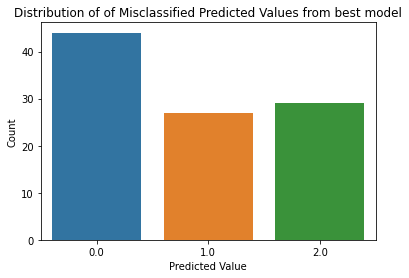

In [0]:
# Author: Ameen

import seaborn as sns
import matplotlib.pyplot as plt

# create a count plot of predicted values
sns.countplot(x='prediction', data=misclassified_100)

# set the plot title and labels
plt.title('Distribution of of Misclassified Predicted Values from best model')
plt.xlabel('Predicted Value')
plt.ylabel('Count')

# display the plot
plt.show()